In [1]:
!pip install yfinance -q
!pip install plotly -q
!pip install matplotlib -q
!pip install pandas -q


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import yfinance as yf
import plotly.graph_objects as go  ## better display graphs

In [4]:
## Example pulling Microsoft Stock

In [5]:
msft = yf.Ticker("MSFT")

In [6]:
hist = msft.history(period="max")

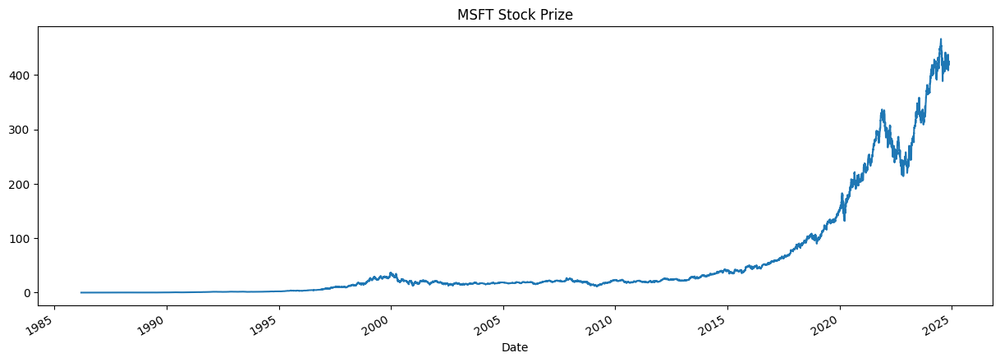

In [11]:
hist['Open'].plot(figsize=(15,5), title = "MSFT Stock Prize")
plt.show()

In [12]:
msft.balance_sheet

,2024-06-30,2023-06-30,2022-06-30,2021-06-30
Ordinary Shares Number,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Share Issued,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Net Debt,33315000000.0,12533000000.0,35850000000.0,43922000000.0
Total Debt,67127000000.0,59965000000.0,61270000000.0,67775000000.0
Tangible Book Value,121660000000.0,128971000000.0,87720000000.0,84477000000.0
...,...,...,...,...
Cash Cash Equivalents And Short Term Investments,75531000000.0,111256000000.0,104749000000.0,130256000000.0
Other Short Term Investments,57216000000.0,76552000000.0,90818000000.0,116032000000.0
Cash And Cash Equivalents,18315000000.0,34704000000.0,13931000000.0,14224000000.0
Cash Equivalents,6744000000.0,26226000000.0,5673000000.0,6952000000.0


In [13]:
msft.calendar

{'Dividend Date': datetime.date(2024, 12, 11),
 'Ex-Dividend Date': datetime.date(2024, 11, 20),
 'Earnings Date': [datetime.date(2025, 1, 28), datetime.date(2025, 2, 3)],
 'Earnings High': 3.47,
 'Earnings Low': 3.08,
 'Earnings Average': 3.16286,
 'Revenue High': 70520000000,
 'Revenue Low': 68488700000,
 'Revenue Average': 68937174200}

In [15]:
## Pulling other stocks
## top 10 stocks to buy in 2024

In [14]:
stonks = ['MSFT','NVDA','GOOGL','META','JPM','XOM','MA','CRM','AMD','AXP','MS']

In [15]:
hists = {}
for s in stonks:
    tkr = yf.Ticker(s)
    history = tkr.history(period='10y')  ## pulling 10 year data
    hists[s] = history

In [16]:
## Plotting the stock prize

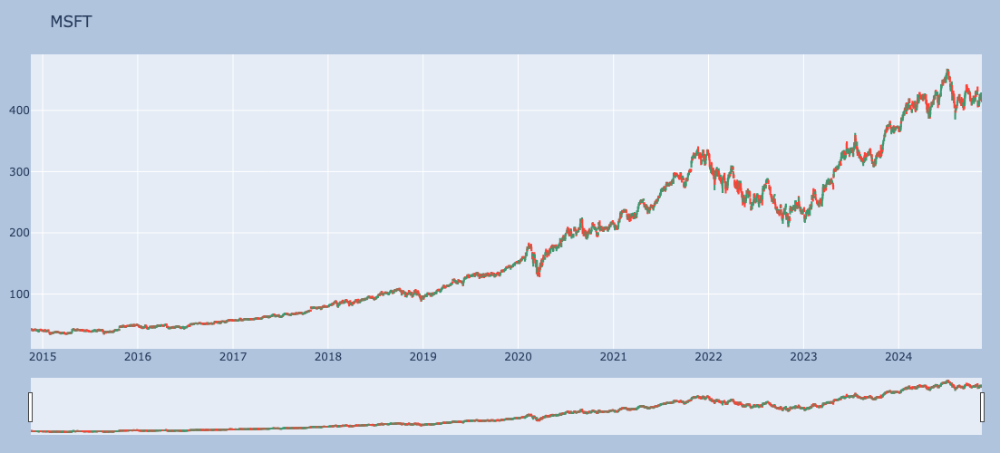

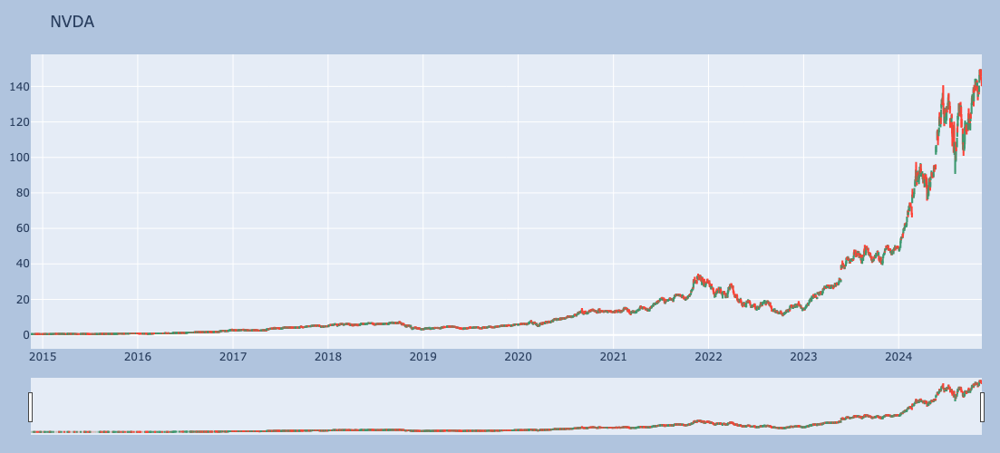

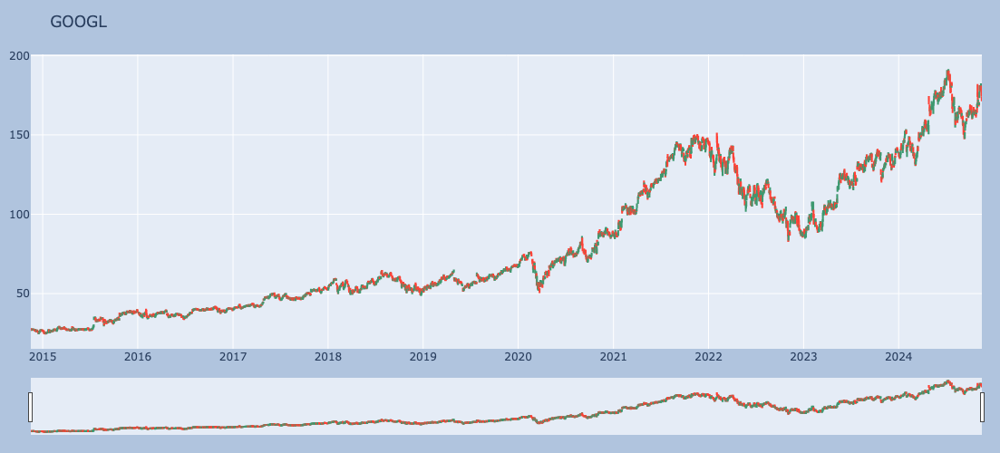

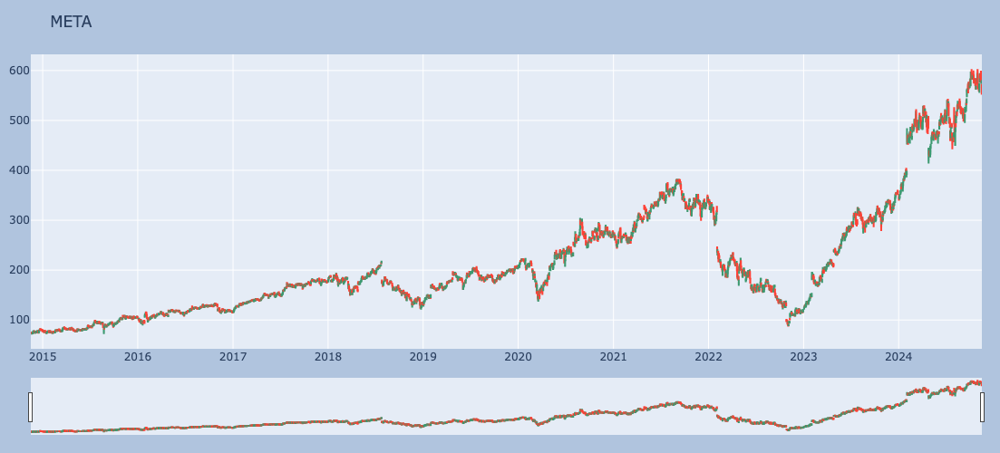

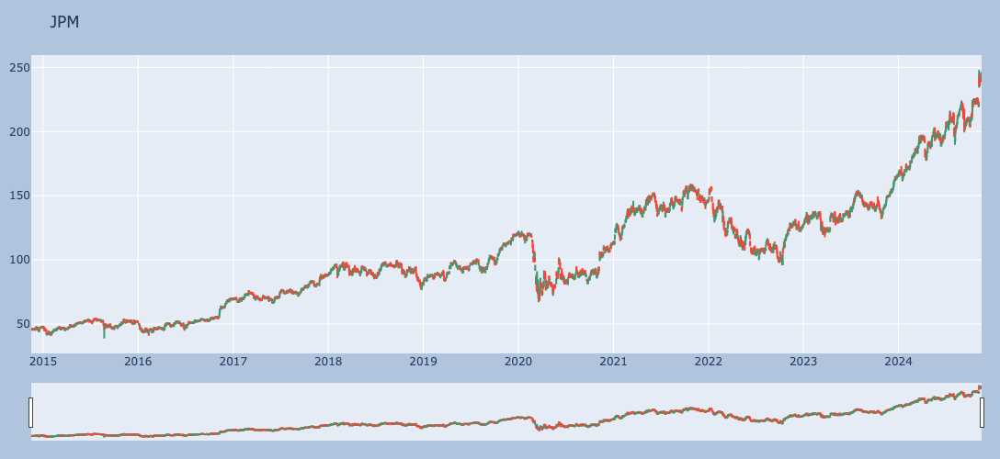

...

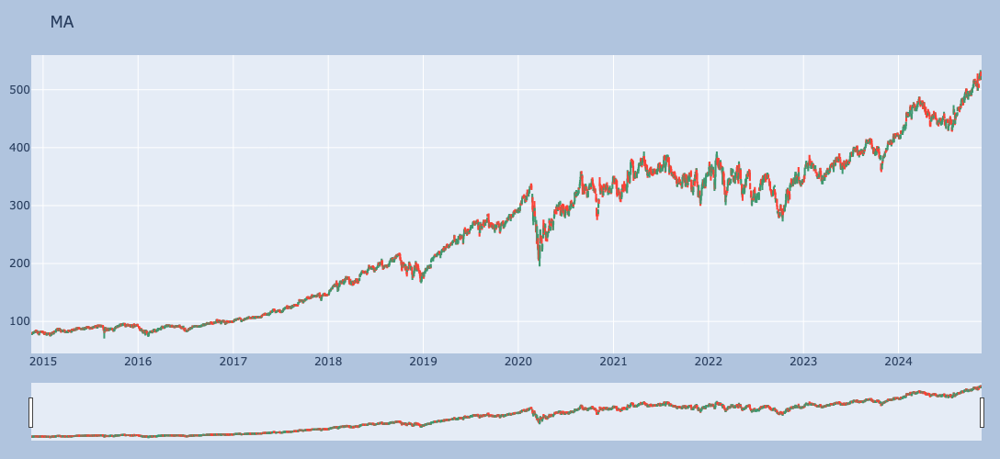

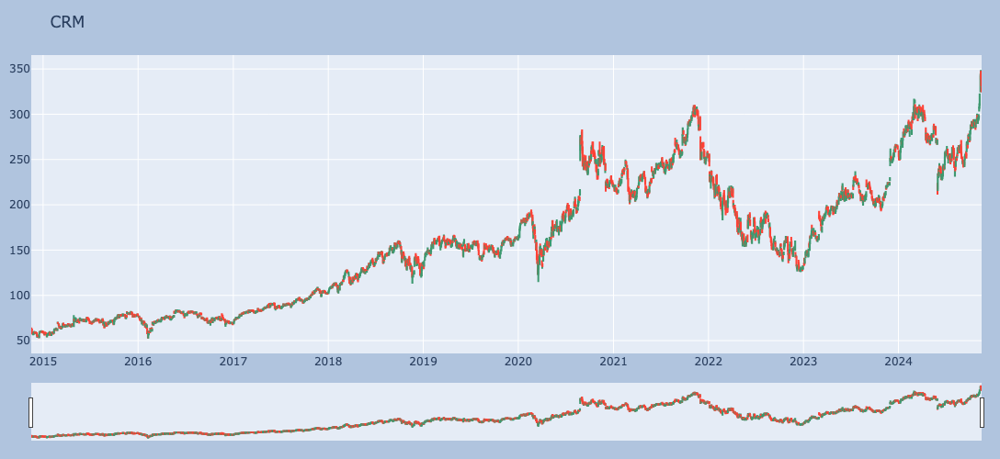

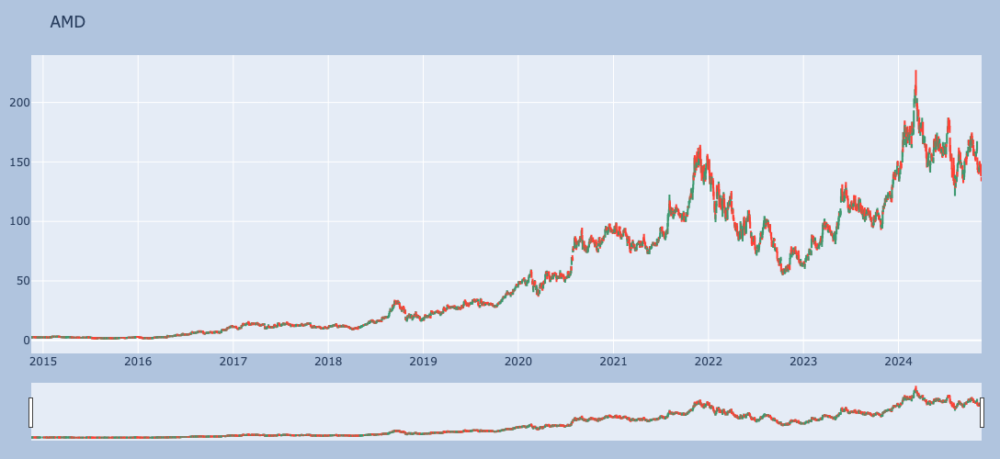

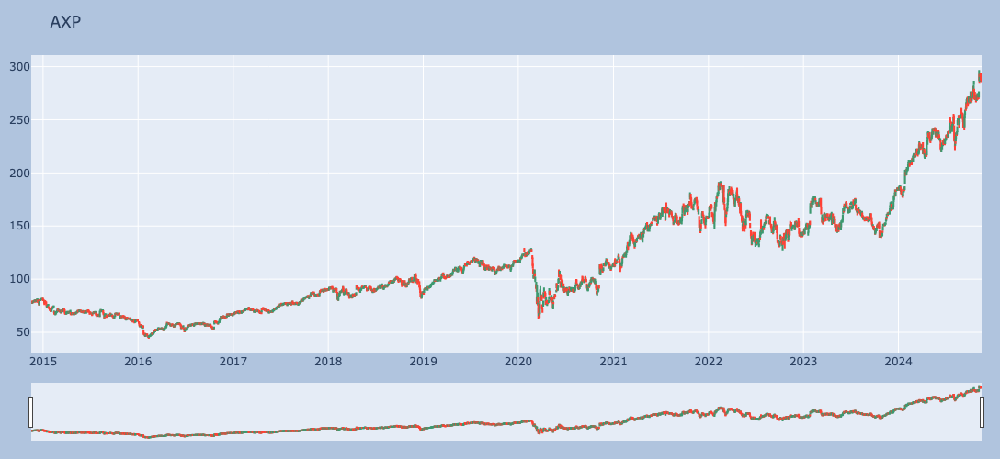

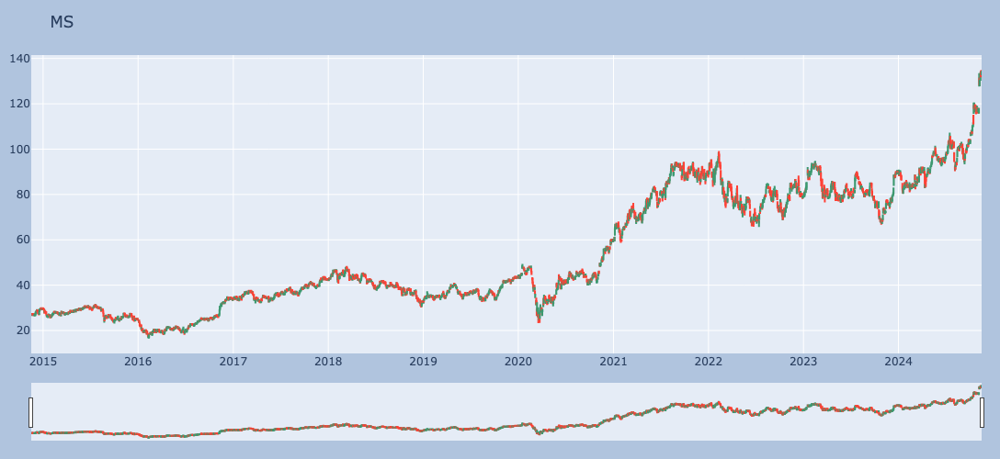

In [17]:
for stock in stonks:
    temp_df = hists[stock].copy()
    
    fig = go.Figure(
        data=[
            go.Candlestick(
                x = temp_df.index,
                open = temp_df["Open"],
                high = temp_df["High"],
                low = temp_df["Low"],
                close = temp_df["Close"],
            )
        ]
    )
    
    fig.update_layout(
        margin = dict(l=20, r=20, t=60, b=20),
        height = 500,
        paper_bgcolor = "LightSteelBlue",
        title = stock,
    )
    
    fig.show()

In [33]:
# Calculating Moving averages
# SMA - Simple Moving Average
# SMA = (Closing Price Day 1 + Closing Price Day 2 + ... + Closing Price Day N) / N
# N = the number of days in the period you are calculating the average for. 

# Moving averages smooth out price fluctuations and help identify trends.

In [34]:
for stock, data in hists.items():
    data['SMA_10'] = data['Close'].rolling(window=10).mean()  # 10-day Simple Moving Average
    data['SMA_50'] = data['Close'].rolling(window=50).mean()  # 50-day Simple Moving Average
    data.dropna(inplace=True)  # Drop NaN rows caused by rolling

In [35]:
# Splitting the Data into Training and Testing Sets

# The data is split into:
# X_train, y_train (80%): Used to train the model.
# X_test, y_test (20%): Used to test the model.
# shuffle=False ensures the data is split sequentially (important for time-series data).

#The model learns patterns from the training data and evaluates performance on unseen test data.

In [36]:
from sklearn.model_selection import train_test_split

# Using MSFT data as an example
msft_data = hists['MSFT'][['Close', 'SMA_10', 'SMA_50']].dropna()
X = msft_data[['SMA_10', 'SMA_50']]  # Features
y = msft_data['Close']  # Target variable (Close price)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)


In [37]:
# Random Forest Regression

# A RandomForestRegressor is trained on X_train (features) and y_train (target).
# Random Forest works by averaging the predictions of many decision trees. This reduces overfitting and improves generalization.

In [38]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Train a Random Forest Regressor
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Make predictions
predictions = rf_model.predict(X_test)

In [39]:
# Model Evaluation

# Calculates the Mean Squared Error (MSE) to evaluate the model’s performance
# MSE quantifies the average squared difference between predicted and actual values.
# Lower MSE indicates better model performance.

In [40]:
# Evaluate the model
mse = mean_squared_error(y_test, predictions)
print("Mean Squared Error:", mse)

Mean Squared Error: 5434.965775575159


In [41]:
# Plotting Predicted vs Actual Prices

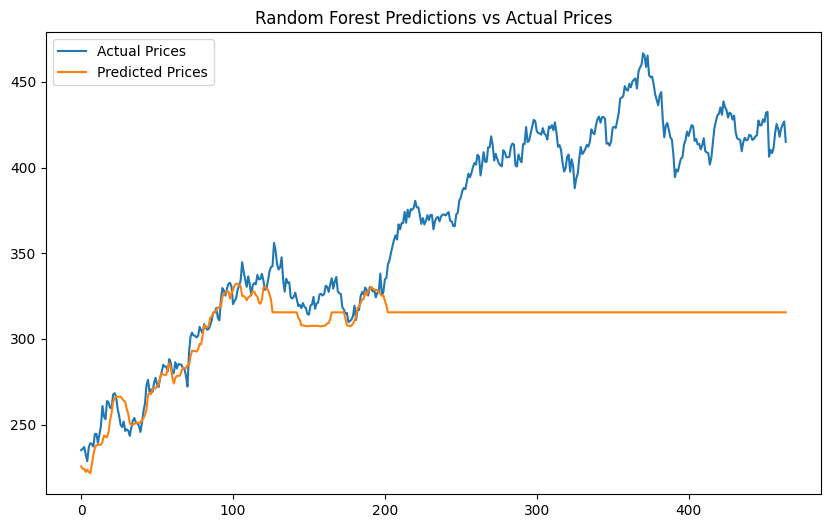

In [42]:
plt.figure(figsize=(10, 6))
plt.plot(y_test.values, label="Actual Prices")
plt.plot(predictions, label="Predicted Prices")
plt.legend()
plt.title("Random Forest Predictions vs Actual Prices")
plt.show()

In [43]:
# Interpretation:

# MSE: Measures error magnitude; lower is better.
# MAE: Indicates the average error in prediction.
# R-squared: Ranges from 0 to 1; higher values indicate better model fit. Negative R^2 
# suggests the model performs worse than a naive mean prediction.

In [44]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test, predictions)
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"R-squared: {r2}")


MSE: 5434.965775575159
MAE: 57.088550289687284
R-squared: -0.4841926656038815
